En esta segunda parte del trabajo, los análisis se realizan entorno a dos mesesconcretos, Diciembre de 2018 y Junio de 2019 que, como vimos previamente, son los meses que menos y que más viajes registran respectivamente, de los comprendidos en el periodo seleccionado en la primera parte.

                              ÍNDICE PARTE II

                      1.PROBLEMA 1:Duración media de los viajes

                      2.PROBLEMA 2:Estaciones de destino más frecuentes

                      3.PROBLEMA 3:Estaciones de origen más frecuentes

                      4.PROBLEMA 4:Viajes por barrio

                      5.Elaboración de mapas con los datos recogidos

                      6.Algoritmo de Floyd.Optimización de rutas
                        según el tránsito

# Carga de paquetes necesarios y puesta a punto

Inicialmente, es necesario acceder a la unidad compartida de drive en la que se almacenan los archivos que se van a utilizar.

Al ejecutar esta celda, se muestra un enlace que permite la vinculación y el acceso al drive. Basta con abirlo y copiar el enlace que aparece. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
drive.mount("/content/drive", force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
Mounted at /content/drive


In [ ]:
path = '/content/drive/Shared drives/Practica BICIMAD/'

In [ ]:
!apt-get install openjdk-8-jdk
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
!pip install pyspark

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pylab import *


In [ ]:
from pyspark import SparkContext
import json

sc = SparkContext()

# Carga de datos

Leemos las rdds del mejor y peor mes de acuerdo a los resultados obtenidos en la parte anterior para los viajes filtrados, pues sólo nos interesa trabajar con los viajes que hemos considerado válidos. El peor mes es diciembre de 2018 y el mejor mes es junio de 2019.

In [ ]:
rdd_worst = sc.textFile(path+'201812_Usage_Bicimad.json')
rdd_best = sc.textFile(path+'201906_Usage_Bicimad.json')

Definimos un mapper, que aplicaremos a la hora de leer los archivos json relativos al peor y mejor mes, para quedarnos únicamente con los datos que van a ser necesario:


*   Estación de origen
*   Estación de destino
*   Tiempo de viaje







In [ ]:
def mapper(line):
  data = json.loads(line)
  origin = data['idunplug_station']
  destination = data['idplug_station']
  travel_time = data['travel_time']
  return origin, destination, travel_time

Filtramos los viajes por aquellos que duran más de 30 segundos y sus estaciones de origen y destino son distintas.
Cada elemento de las rdd *rdd_worst_filtered*  (para el peor mes)  y *rdd_best_filtered*  (para el mejor mes)  será de la forma:
 
  *(estacion de origen, estacion de destino, tiempo de viaje en segundos)*

In [ ]:
rdd_worst_filtered = rdd_worst.map(mapper).\
                     filter(lambda x: x[0]!=x[1] and x[2]>30)

rdd_best_filtered = rdd_best.map(mapper).\
                    filter(lambda x: x[0]!=x[1] and x[2]>30)

A continuación, vamos a desarollar distintos problemas para el mejor y peor mes considerados. Primero calcularemos los datos que nos interesan y después vamos a crear mapas en los que visualizaremso la información de una forma más interactiva.

# PROBLEMA 1: DURACIÓN MEDIA

Vamos a calcular la duración media de los viajes que parten de una estación. Recordamos que el timepo se guarda en segundos.

En primer lugar, lo hacemos para el **peor mes**.

1.   Creamos un diccionario en el que las claves son las estaciones de origen y el valor, las veces que aparece en la rdd de viajes filtrados. Es decir, el número de viajes que parten de ella. Será relevente para calcular el tiempo medio.
2.   Nos quedamos con la estación de origen y el tiempo de cada viaje, los reducimos según la clave mediante la suma de valores. Hallamos la media. Los ordenamos según el número de estacion de menor a mayor.



In [ ]:
dict_worst = dict(rdd_worst_filtered.map(lambda x: (x[0], x[2])).\
                              countByKey())

rdd_average_time_worst = rdd_worst_filtered.map(lambda x: (x[0],x[2])).\
                        reduceByKey(lambda x,y: x+y).\
                        map(lambda x: (x[0], x[1]/dict_worst[x[0]])).\
                        sortByKey()

rdd_average_time_worst.take(5) #Para visualizar cómo quedan los datos

[(1, 2392.098510882016),
 (2, 4149.476772616137),
 (3, 1018.5118811881188),
 (4, 1059.5748829953197),
 (5, 973.8588235294118)]

Repetimos lo mismo, esta vez con el **mejor mes**.

In [ ]:
dict_best = dict(rdd_best_filtered.map(lambda x: (x[0], x[2])).\
                              countByKey())

rdd_average_time_best = rdd_best_filtered.map(lambda x: (x[0],x[2])).\
                        reduceByKey(lambda x,y: x+y).\
                        map(lambda x: (x[0], x[1]/dict_best[x[0]])).\
                        sortByKey()

rdd_average_time_best.take(5)

[(1, 845.8831627250265),
 (2, 996.0376794258373),
 (3, 906.6870662460568),
 (4, 836.7305825242719),
 (5, 935.4925458715596)]

In [ ]:
rdd_average_time_comp = rdd_average_time_best.join(rdd_average_time_worst).sortByKey().map(lambda x: (x[0], x[1][0], x[1][1], x[1][0]-x[1][1]))
rdd_average_time_comp.take(5)

[(1, 845.8831627250265, 2392.098510882016, -1546.2153481569894),
 (2, 996.0376794258373, 4149.476772616137, -3153.4390931903),
 (3, 906.6870662460568, 1018.5118811881188, -111.82481494206195),
 (4, 836.7305825242719, 1059.5748829953197, -222.84430047104786),
 (5, 935.4925458715596, 973.8588235294118, -38.36627765785215)]

Para hacer mejor un análisis de los datos lo que hacemos es representar los valores obtenidos en una gráfica. Para ello, lo primero que hacemos es crear un Data Frame y un Panda para poder obtener las columnas y hacer la gráfica comparativa.

In [ ]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

In [ ]:
dft = spark.createDataFrame(rdd_average_time_comp, schema = ['Station number', 'Average travel time best month','Average travel time worst month', 'Difference best month-worst month' ])
pt = dft.toPandas()
pt.head()

,Station number,Average travel time best month,Average travel time worst month,Difference best month-worst month
0,1,845.883163,2392.098511,-1546.215348
1,2,996.037679,4149.476773,-3153.439093
2,3,906.687066,1018.511881,-111.824815
3,4,836.730583,1059.574883,-222.844300
4,5,935.492546,973.858824,-38.366278


In [ ]:
stations = list(pt.iloc[:,0])
bm = list(pt.iloc[:,1]) #best month
wm = list(pt.iloc[:,2]) #worst month
d = list(pt.iloc[:,3]) #difference

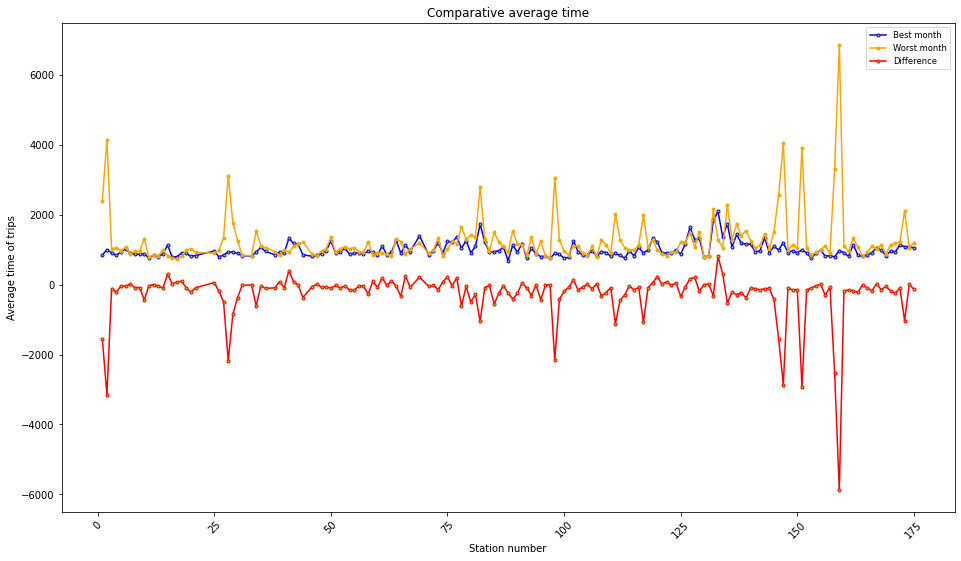

In [ ]:
p1 = plot(stations, bm,c='b',label='Best month',mfc='y',ls='-',marker='.')
p2 = plot(stations, wm,c='orange',label='Worst month',mfc='y',ls='-',marker='.')
p3 = plot(stations, d,c='r',label='Difference',mfc='y',ls='-',marker='.')
xlabel("Station number")
ylabel("Average time of trips")
legend(loc='best', fontsize = 'small')
title('Comparative average time')
plt.xticks(rotation=45)
plt.rcParams["figure.figsize"] = [16,9] #Ejecutar dos veces para obtener este tamaño
show()

En la gráfica podemos observar que salvo en algunas estaciones, la diferencia está en torno al 0, por lo tanto, podemos deducir que, en general, no hay diferencias significativas en el tiempo medio de viajes en los dos meses que estamos analizando.

El mejor mes, es el que más viajes tiene, por lo tanto, la media de sus viajes era esperable que fuese más lineal ya que tenemos más datos para realizar una mejor media. 

# PROBLEMA 2: ESTACIONES DE DESTINO

Para cada estación, vamos a hallar las 5 estaciones más frecuentes a las que se llega desde un viaje iniciado en la estación considerada.


En primer lugar, lo hacemos para el **peor mes**.


Hacemos un map para quedarnos únicamente con tuplas de la forma *(estacion de origen, estacion de destino)*.

Agrupamos por claves y contamos cuántas veces se repite cada elemento en la segunda componente de la tupla gracias a Counter. Tenemos tuplas en las que la primera componente son las estaciones de origen y la segunda, diccionarios en los que la clave son las estaciones de destino y el valor, la frecuencia con la que aparecen, es decir, cuántos viajes llegan a ella desde la estación de origen.

Los ordenamos según la clave.

Ordenamos la segunda componente de la tupla, que es un diccionario, es orden decreciente según los valores. Nos quedamos con los cinco primeros.

El resultado final es una lista de tuplas de la forma: 
[(estación de origen, [(estación de destino, viajes entre origen y destino)])]


In [ ]:
from collections import Counter

rdd_trips_worst_destinations = rdd_worst_filtered.map(lambda x: (x[0], x[1])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_worst_destinations.take(1)

[(1, [(175, 43), (91, 27), (41, 20), (72, 19), (49, 18)])]

Repetimos para el **mejor mes**.

In [ ]:
rdd_trips_best_destinations = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_best_destinations.take(1)

[(1, [(175, 116), (41, 93), (49, 63), (57, 60), (133, 56)])]

# PROBLEMA 3: ESTACIONES DE ORIGEN 

Para cada estación, hallamos las 5 estaciones más frecuentes desde las que han partido viajes que han llegado a ella.


El desarrollo es análogo al del apartado anterior.

Para el **peor mes**.

In [ ]:
from collections import Counter

rdd_trips_worst_origins = rdd_worst_filtered.map(lambda x: (x[1], x[0])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_worst_origins.take(1)

[(1, [(175, 50), (41, 40), (49, 31), (57, 27), (39, 26)])]

Para el **mejor mes**.

In [ ]:
from collections import Counter

rdd_trips_best_origins = rdd_best_filtered.map(lambda x: (x[1], x[0])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_best_origins.take(1)

[(1, [(175, 148), (57, 80), (41, 80), (49, 73), (129, 61)])]

# PROBLEMA 4: VIAJES POR BARRIO

Queremos calcular:

Número de viajes cuya estación de origen está en el **mismo barrio** que su estación de llegada.

Número de viajes cuya estación de origen está en un **barrio distinto** al de su estación de llegada.

### Problemas encontrados

A la hora de resolver este apartado, hemos tenido un problema debido a la incompletitud de los datos ofrecidos por Bicimad y el Portal de Datos Abiertos del Ayuntamiento de Madrid.

Para hacer este apartado, necesitábamos un dataset en el que apareciese el barrio es el que se situaba cada estación. Por ello, explorando en el portal de datos abiertos, decidimos utilizar el excell que se ofrece en https://datos.madrid.es/sites/v/index.jsp?vgnextoid=e9b2a4059b4b7410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD . 
Pero tiene varios inconvenientes:


1.   Nosotros estamos consideando los meses de diciembre y junio 2018 y 2019 (resp.), pero aquí aparecen las estaciones actualizadas a abril de 2020. Es por ello que hay más estaciones en este dataset que las que había a disposición de los usuarios en los meses que consideramos. A priori no es algo del todo negativo, si esas estaciones no existiesen en los meses consierados, no influirían, no serían consideradas en el proceso. Para intentar solvntarlo parcialmente, hemos eliminado estaciones duplicadas tipo 001a 001b, pues no aparecen en los dataset que tratamos, para dejar sólo una estacion 1. 
2.   En ese dataset no aparecen todas las estaciones que sí aparecen en los meses considerados. Por ejemplo, las estaciones 21, 28, 64 y 66.

Para solventar la segunda parte, inicialmente pensamos en utilizar los archivos *'Situación estaciones bicimad por día y hora de Diciembre de 2018'* y *'Situación estaciones bicimad por día y hora de Junio de 2019'* ofrecidos en https://opendata.emtmadrid.es/Datos-estaticos/Datos-generales-(1). Si bien, a pesar de poder obtener la latitud, longitud y dirección de las estaciones desconocidas, en estos datasets no aparece el barrio en el que se sitúa cada estación.  Pero con los datasets ocurre algo similar. Las estaciones 21, 64 y 66 siguen sin aparecer.

Para comprobar la inexistencia de las estciones 21, 64 y 66 en *'Situación estaciones bicimad por día y hora de Diciembre de 2018'* y *'Situación estaciones bicimad por día y hora de Junio de 2019'*, adjuntamos el siguiente fragmento




In [ ]:
r_aux = sc.textFile(path+'Bicimad_Stations_201812.json')
#igualmente pordía hacerse leyendo path+'Bicimad_Stations_201906.json

In [ ]:
r_aux.take(1)

['{ "_id" : "2018-12-01T00:30:12.524146", "stations" : [ { "activate" : 1, "name" : "Puerta del Sol A", "reservations_count" : 0, "light" : 2, "total_bases" : 24, "free_bases" : 13, "number" : "1a", "longitude" : "-3.7024255", "no_available" : 0, "address" : "Puerta del Sol n� 1", "latitude" : "40.4168961", "dock_bikes" : 10, "id" : 1 }, { "activate" : 1, "name" : "Puerta del Sol B", "reservations_count" : 0, "light" : 1, "total_bases" : 24, "free_bases" : 2, "number" : "1b", "longitude" : "-3.7024207", "no_available" : 0, "address" : "Puerta del Sol n� 1", "latitude" : "40.4170009", "dock_bikes" : 22, "id" : 2 }, { "activate" : 1, "name" : "Miguel Moya", "reservations_count" : 0, "light" : 1, "total_bases" : 24, "free_bases" : 5, "number" : "2", "longitude" : "-3.7058415", "no_available" : 0, "address" : "Calle Miguel Moya n� 1", "latitude" : "40.4205886", "dock_bikes" : 17, "id" : 3 }, { "activate" : 1, "name" : "Plaza Conde Suchil", "reservations_count" : 0, "light" : 2, "total_base

In [ ]:
def mapper_aux(line):
  data = json.loads(line)
  station = data['stations']
  return station

In [ ]:
rdd_aux2 = r_aux.map(mapper_aux).\
           map(lambda l: [d for d in l if (d["number"]=="21" or d["number"]=="64" or d["number"]=="66"
                                       or  d["number"]==21 or d["number"]==64 or d["number"]==66)])

In [ ]:
rdd_aux2.collect()

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],


En cambio, la 28 sí aparece

In [ ]:
rdd_aux3 = r_aux.map(mapper_aux).\
           map(lambda l: [d for d in l if (d["number"]=="28" or d["number"]==28)])
rdd_aux3.collect()

[[{'activate': 1,
   'address': 'Calle Alcal� n� 27',
   'dock_bikes': 9,
   'free_bases': 12,
   'id': 32,
   'latitude': '40.4181663',
   'light': 2,
   'longitude': '-3.6992600',
   'name': 'Sevilla',
   'no_available': 0,
   'number': '28',
   'reservations_count': 0,
   'total_bases': 24}],
 [{'activate': 1,
   'address': 'Calle Alcal� n� 27',
   'dock_bikes': 9,
   'free_bases': 12,
   'id': 32,
   'latitude': '40.4181663',
   'light': 2,
   'longitude': '-3.6992600',
   'name': 'Sevilla',
   'no_available': 0,
   'number': '28',
   'reservations_count': 0,
   'total_bases': 24}],
 [{'activate': 1,
   'address': 'Calle Alcal� n� 27',
   'dock_bikes': 7,
   'free_bases': 13,
   'id': 32,
   'latitude': '40.4181663',
   'light': 2,
   'longitude': '-3.6992600',
   'name': 'Sevilla',
   'no_available': 0,
   'number': '28',
   'reservations_count': 0,
   'total_bases': 24}],
 [{'activate': 1,
   'address': 'Calle Alcal� n� 27',
   'dock_bikes': 4,
   'free_bases': 16,
   'id': 32,
 

Por tanto, como la incompletitud y falta de rigor de los datos ofrecidos por Bicimad no entra dentro de nuestras competencias, en lo que sigue trataeremos únicamente con las estaciones presentes en el archio excell *'bases_bicimad.xls'* que ha sido convertido a un archivo json, *bases_bicimad_json* para adaptarnos al uso de rdds que estamos haciendo en esta práctica. Si bien, también podríamhos haberlo tratado como archivo excell.

## Solución

In [ ]:
def mapper_stations(line):
  data = json.loads(line)
  number = data['Número']
  district = data['Distrito']
  neighbourhood = data['Barrio']
  latitude = data['LATITUD']
  longitude = data['LONGITUD']
  address = data['DIRECCION']
  return number, district, neighbourhood, latitude, longitude, address

In [ ]:
rdd_stations = sc.textFile(path+'bases_bicimad.json')

Vamos a crear un diccionario en el que las claves son las estaciones y los valores son los barrios a los que pertenecen.
Hemos añadido algunas claves que se deben a que ampliaciones posteriores a los meses que estamos considerando, pero mantienen direcciones. 

In [ ]:
rdd_stations_neighbourhood = rdd_stations.map(mapper_stations).\
                             map(lambda x: (str(x[0]), x[2]))

In [ ]:
neighbourhood = dict(rdd_stations_neighbourhood.collect())

Para el **peor mes**.

En la rdd que estamos usando, no hay datos relativos a todas las estaciones, así que hemos de filtrarlas en caso de que no aparezcan. Utilizamos sólo las que aparecen en el excel indicado *bases_bicimad.xls* y en su respectivo *.json* Ejemplo: estaciones 66, 64, 21..



*   Partiendo de *rdd_worst_filtered* en la que habíamos 
almacenado los viajes que consideramos válidos, es decir, aquellos que durán más de 30 s y cuyas estaciones de origen y destino son distintas, mapeamos para quedarnos sólo con la estación de origen y destino.

*   Filtramos comprobando que la primera componente (estación de origen) está en el diccionario que utilizaremos para averiguar el barrio al que pertenece.

*   Filtramos comprobando que la segunda componente (estación de destino) está en el diccionario que utilizaremos para averiguar el barrio al que pertenece.

*   Filtramos quedándonos únicamente con las tuplas en las que la estación de origen está en un barrio distinto a la de destino.

*  Agrupamos según claves (estaciones de origen) y almacenamos los valores (estaciones de destino) en tuplas.

*   Mapeamos sobre los valores, para convertir las estaciones en sus respectivos barrios.

*   Mapeamos sobre los valores para contar cuántas veces se repite cada barrio.


*   Mapeamos sobre los valores para ordenarlos de mayor a menor frecuencia.

*   Ordenamos según las claves.












Nos devuelve tuplas en las que la primera componente es el numero de la estacion de origen y la segunda es una lista de tuplas en la que la primera componente es un barrio y la segunda, el número de viajes que llegan a dicho barrio desde la estación de origen, teniendo en cuenta que el barrio de destino sea distinto al barrio de la estación de partida. Se ordenan por orden de frecuencia de mayor a menor.

In [ ]:
rdd_worst_distinct_neighbourhood = rdd_worst_filtered.map(lambda x: (x[0], x[1])).\
                          filter(lambda x: str(x[0]) in neighbourhood).\
                          filter(lambda x: str(x[1]) in neighbourhood).\
                          filter(lambda x: neighbourhood[str(x[0])] != neighbourhood[str(x[1])]).\
                          groupByKey().mapValues(tuple).\
                          mapValues(lambda y: [neighbourhood[str(z)] for z in y]).\
                          mapValues(Counter).\
                          mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                          sortByKey()

rdd_worst_distinct_neighbourhood.take(5)

[(1,
  [('01-02 EMBAJADORES', 84),
   ('04-01 RECOLETOS', 66),
   ('02-05 DELICIAS', 62),
   ('01-04 JUSTICIA', 62),
   ('05-01 EL VISO', 44),
   ('01-05 UNIVERSIDAD', 43),
   ('07-05 RÍOS ROSAS', 39),
   ('03-05 JERÓNIMOS', 37),
   ('07-01 GAZTAMBIDE', 35),
   ('03-06 NIÑO JESÚS', 35),
   ('01-03 CORTES', 29),
   ('02-02 ACACIAS', 29),
   ('06-02 CUATRO CAMINOS', 22),
   ('01-01 PALACIO', 22),
   ('04-02 GOYA', 22),
   ('09-01 CASA DE CAMPO', 20),
   ('03-02 ADELFAS', 20),
   ('03-03 ESTRELLA', 20),
   ('03-04 IBIZA', 16),
   ('02-06 PALOS DE MOGUER', 15),
   ('02-01 IMPERIAL', 14),
   ('09-02 ARGÜELLES', 13),
   ('03-01 PACÍFICO', 13),
   ('07-04 ALMAGRO', 12),
   ('04-06 CASTELLANA', 11),
   ('07-03 TRAFALGAR', 8),
   ('02-03 CHOPERA', 7),
   ('02-07 ATOCHA', 7),
   ('05-04 HISPANOAMÉRICA', 5),
   ('04-05 LISTA', 5),
   ('05-05 NUEVA ESPAÑA', 3),
   ('07-02 ARAPILES', 3),
   ('06-03 CASTILLEJOS', 2)]),
 (2,
  [('04-01 RECOLETOS', 34),
   ('03-05 JERÓNIMOS', 28),
   ('02-05 DELICIAS'

Si quisiésemos el total de viajes que cambian de distrito para cada estación: para la segunda componente de cada tupla (que es una lista de tuplas) sumamos la segunda componente de cada tupla que aparece en la lista.

In [ ]:
rdd_worst_total_distinct_neighbourhood = rdd_worst_distinct_neighbourhood.mapValues(lambda l: sum(x[1] for x in l))

rdd_worst_total_distinct_neighbourhood.take(5)

[(1, 825), (2, 382), (3, 1989), (4, 1214), (5, 1136)]

Si nos interesase conocer cuántos viajes acaban en el mismo barrio del que parten, trataríamos los datos de manera similar.

In [ ]:
rdd_worst_same_neighbourhood = rdd_worst_filtered.map(lambda x: (x[0], x[1])).\
                          filter(lambda x: str(x[0]) in neighbourhood).\
                          filter(lambda x: str(x[1]) in neighbourhood).\
                          filter(lambda x: neighbourhood[str(x[0])] == neighbourhood[str(x[1])]).\
                          groupByKey().mapValues(tuple).\
                          mapValues(lambda x: len(x)).\
                          sortByKey()

rdd_worst_same_neighbourhood.take(5)

[(1, 30), (2, 16), (3, 4), (4, 49), (5, 117)]

Para el **mejor mes**, repetimos el apartado

In [ ]:
rdd_best_distinct_neighbourhood = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                          filter(lambda x: str(x[0]) in neighbourhood).\
                          filter(lambda x: str(x[1]) in neighbourhood).\
                          filter(lambda x: neighbourhood[str(x[0])] != neighbourhood[str(x[1])]).\
                          groupByKey().mapValues(tuple).\
                          mapValues(lambda y: [neighbourhood[str(z)] for z in y]).\
                          mapValues(Counter).\
                          mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                          sortByKey()

rdd_best_distinct_neighbourhood.take(5)

[(1,
  [('01-02 EMBAJADORES', 366),
   ('01-04 JUSTICIA', 219),
   ('04-01 RECOLETOS', 176),
   ('07-05 RÍOS ROSAS', 175),
   ('02-05 DELICIAS', 148),
   ('03-05 JERÓNIMOS', 133),
   ('01-03 CORTES', 122),
   ('05-01 EL VISO', 105),
   ('01-05 UNIVERSIDAD', 102),
   ('03-06 NIÑO JESÚS', 96),
   ('02-02 ACACIAS', 96),
   ('07-01 GAZTAMBIDE', 83),
   ('01-01 PALACIO', 81),
   ('03-02 ADELFAS', 75),
   ('04-06 CASTELLANA', 64),
   ('09-02 ARGÜELLES', 61),
   ('03-04 IBIZA', 58),
   ('02-06 PALOS DE MOGUER', 55),
   ('06-02 CUATRO CAMINOS', 55),
   ('09-01 CASA DE CAMPO', 47),
   ('07-03 TRAFALGAR', 45),
   ('07-04 ALMAGRO', 44),
   ('03-01 PACÍFICO', 39),
   ('02-03 CHOPERA', 38),
   ('04-02 GOYA', 36),
   ('03-03 ESTRELLA', 32),
   ('02-01 IMPERIAL', 19),
   ('04-03 FUENTE DEL BERRO', 19),
   ('07-02 ARAPILES', 18),
   ('04-05 LISTA', 16),
   ('04-04 GUINDALERA', 14),
   ('06-03 CASTILLEJOS', 12),
   ('02-07 ATOCHA', 12),
   ('05-04 HISPANOAMÉRICA', 9),
   ('07-06 VALLEHERMOSO', 8),
   (

In [ ]:
rdd_best_total_distinct_neighbourhood = rdd_best_distinct_neighbourhood.mapValues(lambda l: sum(x[1] for x in l))

rdd_best_total_distinct_neighbourhood.take(5)

[(1, 2682), (2, 1588), (3, 3085), (4, 1924), (5, 1518)]

In [ ]:
rdd_best_same_neighbourhood = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                          filter(lambda x: str(x[0]) in neighbourhood).\
                          filter(lambda x: str(x[1]) in neighbourhood).\
                          filter(lambda x: neighbourhood[str(x[0])] == neighbourhood[str(x[1])]).\
                          groupByKey().mapValues(tuple).\
                          mapValues(lambda x: len(x)).\
                          sortByKey()

rdd_best_same_neighbourhood.take(5)

[(1, 86), (2, 48), (3, 9), (4, 73), (5, 179)]

### Comparación

Ahora, vamos a realizar un análisis de lo que ocurre comparando los resultados obtenidos para el mejor y el peor mes.
Vamos a realizar una gráfica en la que mostraremos, del mejor y del peor mes,para cada estación, el porcentaje de viajes que parten de ella que se quedan en el mismo barrio y el porcentaje que se mueven de barrio.

Lo que hacemos es juntar las rdd con un join para tener toda la información que nos interesa de cada mes, en una misma rdd.

In [ ]:
rdd_worst_neighbourhood_info = rdd_worst_total_distinct_neighbourhood.join(rdd_worst_same_neighbourhood).sortByKey().map(lambda x:(x[0],(x[1][0]/(x[1][0]+x[1][1])*100,x[1][1]/(x[1][0]+x[1][1])*100)))
rdd_worst_neighbourhood_info.take(5)

[(1, (96.49122807017544, 3.508771929824561)),
 (2, (95.97989949748744, 4.0201005025125625)),
 (3, (99.79929754139488, 0.2007024586051179)),
 (4, (96.12034837688044, 3.879651623119557)),
 (5, (90.66241021548284, 9.337589784517158))]

In [ ]:
rdd_best_neighbourhood_info = rdd_best_total_distinct_neighbourhood.join(rdd_best_same_neighbourhood).sortByKey().map(lambda x:(x[0],(x[1][0]/(x[1][0]+x[1][1])*100,x[1][1]/(x[1][0]+x[1][1])*100)))
rdd_best_neighbourhood_info.take(5)

[(1, (96.89306358381504, 3.106936416184971)),
 (2, (97.06601466992664, 2.93398533007335)),
 (3, (99.70911441499678, 0.2908855850032321)),
 (4, (96.34451677516275, 3.655483224837256)),
 (5, (89.45197407189157, 10.548025928108427))]

Creamos un rdd en el que tenemos:

('Station', '% trips worts month dist neig.', '% trips worts month same neig.,'% trips best month dist neig., '% trips best month same neig.)



In [ ]:
rdd_neighbourhoods_info = rdd_worst_neighbourhood_info.join(rdd_best_neighbourhood_info).sortByKey().map(lambda x: (x[0], x[1][0][0], x[1][0][1], x[1][1][0], x[1][1][1]))
rdd_neighbourhoods_info.take(5)

[(1,
  96.49122807017544,
  3.508771929824561,
  96.89306358381504,
  3.106936416184971),
 (2,
  95.97989949748744,
  4.0201005025125625,
  97.06601466992664,
  2.93398533007335),
 (3,
  99.79929754139488,
  0.2007024586051179,
  99.70911441499678,
  0.2908855850032321),
 (4,
  96.12034837688044,
  3.879651623119557,
  96.34451677516275,
  3.655483224837256),
 (5,
  90.66241021548284,
  9.337589784517158,
  89.45197407189157,
  10.548025928108427)]

Ahora creamos un Data Frame y un Panda para poder obtener las columnas y hacer la gráfica comparativa.

In [ ]:
dfn = spark.createDataFrame(rdd_neighbourhoods_info, schema = ['Station', '% trips worts month dist neig.', '% trips worts month same neig.', '% trips best month dist neig.', '% trips best month same neig.'])
pn = dfn.toPandas()
pn.head()

,Station,% trips worts month dist neig.,% trips worts month same neig.,% trips best month dist neig.,% trips best month same neig.
0,1,96.491228,3.508772,96.893064,3.106936
1,2,95.979899,4.020101,97.066015,2.933985
2,3,99.799298,0.200702,99.709114,0.290886
3,4,96.120348,3.879652,96.344517,3.655483
4,5,90.662410,9.337590,89.451974,10.548026


In [ ]:
stations_n = list(pn.iloc[:,0])
wm_d = list(pn.iloc[:,1])
wm_s = list(pn.iloc[:,2])
bm_d = list(pn.iloc[:,3])
bm_s = list(pn.iloc[:,4])

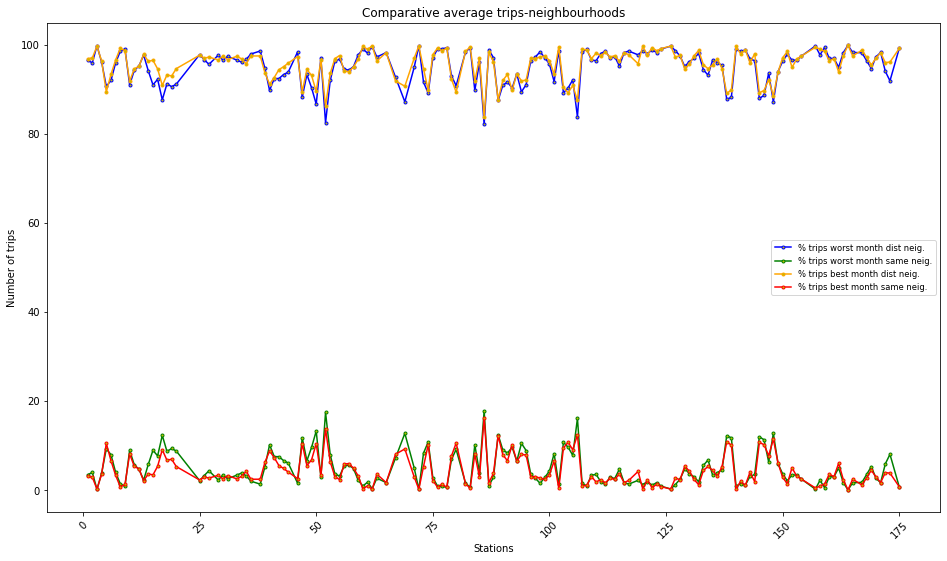

In [ ]:
p1 = plot(stations_n, wm_d,c='b',label='% trips worst month dist neig.',mfc='y',ls='-',marker='.')
p2 = plot(stations_n, wm_s,c='g',label='% trips worst month same neig.',mfc='y',ls='-',marker='.')
p3 = plot(stations_n, bm_d,c='orange',label='% trips best month dist neig.',mfc='y',ls='-',marker='.')
p4 = plot(stations_n, bm_s,c='red',label='% trips best month same neig.',mfc='y',ls='-',marker='.')
xlabel("Stations")
ylabel("Number of trips")
legend(loc='best', fontsize = 'small')
title('Comparative average trips-neighbourhoods')
plt.xticks(rotation=45)
plt.rcParams["figure.figsize"] = [16,9] #Ejecutar dos veces para obtener este tamaño
show()

En la gráfica podemos observar como en porcentaje, tienen un comportamiento muy similar ambos meses.

# MAPAS

En esta sección, vamos a crear varios mapas interactivos utilizando el módulo **folium** de Python, en los que poder visualizar los datos obtenidos anteriormente.
Vamos a representar los datos correspondientes a lo que denominamos peor mes y mejor mes.



En primer lugar, a partir de una hoja de excel obtenida en el Portal de Datos Abiertos de la Comunidad de Madrid y utilizando el módulo de Python **pandas**, creamos un dataframe que, a cada estación(representada por su número) le asocie sus coordenadas geográficas,el barrio y la dirección en la que se encuentra.



In [ ]:
p0 = pd.read_excel(path+"bases_bicimad.xlsx")

#Renaming the columns
p0.columns = ['Station number', 'Gis_X', 'Gis_Y', 'Fecha de Alta', 'District', 'Neighbourhood',
       'Calle', 'Nº Finca', 'Tipo de Reserva', 'Número de Plazas',
       'Unnamed: 10', 'Longitude', 'Latitude', 'Address']

#Taking a subset of our original excel dataset
p0 = p0[['Station number','Longitude', 'Latitude','Neighbourhood', 'Address']]

p0.head()

,Station number,Longitude,Latitude,Neighbourhood,Address
0,1,-3.701998,40.417111,01-06 SOL,"CALLE DE ALCALA, 2"
1,2,-3.705674,40.420580,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1"
2,3,-3.707212,40.430323,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2"
3,4,-3.702674,40.428591,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3"
4,5,-3.702076,40.428363,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106"


Antes de generar los mapas, como queremos ser capaces de distinguir las estaciones según el distrito al que pertenecen, creamos un diccionario auxiliar y una lista a partir de una paleta de colores,que utilizaremos posteriormente.


In [ ]:
rdd_stations = sc.textFile('/content/drive/Shared drives/Practica BICIMAD/bases_bicimad.json')

Para averiguar qué estaciones pertenecen a cada distrito, tratamos la rdd para obtener tuplas de la forma

 (distrito, {conjunto de estaciones}), donde el conjunto de estaciones es una tupla del tipo 

 (numero de estacion, latitud, longitud, calle)

In [ ]:
rdd_neighbourhoods = rdd_stations.map(mapper_stations).\
                map(lambda x: (x[2], (x[0], x[3], x[4], x[5]))).\
                groupByKey().mapValues(set).\
                sortByKey()

Lo convertimos en un diccionario para manejarlo mejor.
Tenemos un diccionario en el que las claves son los distritos y los valores, las estaciones que pertenecen a dicho distrito.


In [ ]:
dictionary_neighbourhoods = dict(rdd_neighbourhoods.collect())

Para ver cuántos distritos hay, contamos el número de claves.


In [ ]:
print('Hay', len(dictionary_neighbourhoods.keys()), 'barrios')

Hay 44 barrios


Generamos una lista a partir de una paleta de 48 colores, que usaremos para crear el mapa

In [ ]:
col = "#00CC00    #33CC00    #66CC00    #99CC00    #CCCC00    #FFCC00 #00CC33    #33CC33    #66CC33    #99CC33    #CCCC33    #FFCC33 #00CC66    #33CC66    #66CC66    #99CC66    #CCCC66    #FFCC66 #00CC99    #33CC99    #66CC99    #99CC99    #CCCC99    #FFCC99 #00CCCC    #33CCCC    #66CCCC    #99CCCC    #CCCCCC    #FFCCCC #00CCFF    #33CCFF    #66CCFF    #99CCFF    #CCCCFF    #00FF00    #33FF00    #66FF00    #99FF00    #CCFF00    #FFFF00 #00FF33    #33FF33    #66FF33    #99FF33    #CCFF33    #FFFF33    #000000"
colores = col.split()

Vamos a hacer un mapa de ejemplo, en el que aparecen las estaciones con un marcador de color distinto según el barrio al que pertenecen.

In [ ]:
import folium
import random

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_index = 0
for key in dictionary_neighbourhoods.keys():
  for value in dictionary_neighbourhoods[key]:
    try:
      lat = float(value[1])
      lon = float(value[2])
    except:
      pass
    loc = [lat, lon]
    dist = key
    dist_color = colores[colour_index]
    datos = "Station number: "+str(value[0])+"\n"+"District: "+dist
    dire = value[3]
    folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = dist_color)).add_to(Mad)
  colour_index += 1
Mad


## Peor mes

A continuación, recopilamos las rdd que contienen la información que nos interesa representar. Estas las convertiremos en dataframes para, finalmente, crear un panda que emplearemos para crear el mapa. Empezamos haciéndolo para el **Peor Mes**.


*   **Duración media:** rdd_average_time_worst ---> df1 --> p1
*   **Estaciones de destino:** rdd_trips_worst_destinations ---> df2 ---> p2
*   **Estaciones de origen:**  rdd_trips_worst_origins ---> df3 --- > p3
*   **Distinto barrio:**  rdd_worst_total_distinct_neighbourhood ---> df4 ---> p4
*   **Mismo barrio:**  rdd_worst_same_neighburhood ---> df5 ---> p5






In [ ]:
df1 = spark.createDataFrame(rdd_average_time_worst, schema = ['Station number', 'Average travel time'])
p1 = df1.toPandas()

df2 = spark.createDataFrame(rdd_trips_worst_destinations, schema = ['Station number', 'Top 5 destinations by frecuency'])
p2 = df2.toPandas()

df3 = spark.createDataFrame(rdd_trips_worst_origins, schema = ['Station number', 'Top 5 origins by frecuency'])
p3 = df3.toPandas()

df4 = spark.createDataFrame(rdd_worst_total_distinct_neighbourhood, schema = ['Station number', 'Travels distint neigh.'])
p4 = df4.toPandas()

df5 = spark.createDataFrame(rdd_worst_same_neighbourhood, schema = ['Station number', 'Travels same neigh.'])
p5 = df5.toPandas()

Los fusionamos para crear un único dataframe ordenado según el número de estación. Si para alguno de los campos no se tiene información, se daja vacío (NaN). Denominado **panda_worst**, este es el dataframe que vamos a utilizar para generar los mapas correspondientes.


In [ ]:
panda_worst = p1.merge(p2, on='Station number', how='left').merge(p3, on='Station number', how='left').merge(p4, on='Station number', how='left').merge(p5, on='Station number', how='left').merge(p0, on='Station number', how='left')

panda_worst.head()

,Station number,Average travel time,Top 5 destinations by frecuency,Top 5 origins by frecuency,Travels distint neigh.,Travels same neigh.,Longitude,Latitude,Neighbourhood,Address
0,1,2392.098511,"[(175, 43), (91, 27), (41, 20), (72, 19), (49,...","[(175, 50), (41, 40), (49, 31), (57, 27), (39,...",825.0,30.0,-3.701998,40.417111,01-06 SOL,"CALLE DE ALCALA, 2"
1,2,4149.476773,"[(175, 23), (99, 20), (109, 16), (167, 15), (9...","[(87, 19), (65, 14), (76, 13), (43, 11), (82, ...",382.0,16.0,-3.705674,40.420580,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1"
2,3,1018.511881,"[(129, 50), (163, 48), (175, 47), (160, 43), (...","[(90, 60), (6, 58), (163, 40), (13, 37), (31, ...",1989.0,4.0,-3.707212,40.430323,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2"
3,4,1059.574883,"[(160, 77), (118, 40), (149, 33), (145, 33), (...","[(160, 64), (149, 49), (118, 48), (145, 34), (...",1214.0,49.0,-3.702674,40.428591,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3"
4,5,973.858824,"[(19, 51), (129, 35), (3, 33), (165, 32), (62,...","[(17, 45), (19, 39), (15, 37), (175, 33), (118...",1136.0,117.0,-3.702076,40.428363,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106"


Algunas consideraciones:
1. El dataframe tiene un total de 167 filas. Esto aparentemente no concuerda con el número de estaciones que hay: 175. La razón por la que esto ocurre es que el json del peor mes no está tan actualizado como el excel, y por tanto no contiene todas las estaciones (en 2018 no había tantas como en 2020).




In [ ]:
panda_worst.iloc[-1]

Station number                                                                   175
Average travel time                                                          1190.98
Top 5 destinations by frecuency    [(135, 129), (38, 113), (43, 105), (132, 97), ...
Top 5 origins by frecuency         [(38, 140), (27, 121), (135, 113), (56, 94), (...
Travels distint neigh.                                                          3440
Travels same neigh.                                                               26
Longitude                                                                   -3.69831
Latitude                                                                     40.3962
Neighbourhood                                                         02-05 DELICIAS
Address                                           CALLE DE JAIME EL CONQUISTADOR, 30
Name: 167, dtype: object


2. Si alguno de los campos no está cubierto para cierta estación, el dataframe lo rellena con un valor de tipo NaN. *Ejemplo:*


In [ ]:
display(panda_worst.loc[[58]])

,Station number,Average travel time,Top 5 destinations by frecuency,Top 5 origins by frecuency,Travels distint neigh.,Travels same neigh.,Longitude,Latitude,Neighbourhood,Address
58,64,1312.428392,"[(79, 121), (78, 109), (90, 99), (129, 61), (7...","[(78, 124), (79, 106), (57, 79), (89, 66), (90...",NaN,NaN,NaN,NaN,NaN,NaN


Todos los mapas asocian un color a cada distrito (hay un total de 46). Por lo tanto, todas las estaciones pertenecientes al mismo distrito son del mismo color.

### Duración media

Este mapa nos muestra las estaciones y la duración media (en segundos) de los viajes que parten de ellas. Cuanto mayor sea esta, mayor es el área coloreada que rodea a la estación.


In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_worst.shape[0]):
  if panda_worst.iloc[x,7] > -1000 and panda_worst.iloc[x,6] > -1000:
      lat = float(panda_worst.iloc[x,7])
      lon = float(panda_worst.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_worst.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  trav_dif = str((panda_worst.iloc[x,4]))
  trav_same = str((panda_worst.iloc[x,5]))
  datos = "<b>Station number: </b>"+str(panda_worst.iloc[x,0])+""+"\n"+"<b>Avg. travel time: </b>"+str(round(panda_worst.iloc[x,1]))
  dire = panda_worst.iloc[x,9]
  rad = panda_worst.iloc[x,1]/60.
  folium.CircleMarker(location=loc, radius=rad, popup= datos,tooltip = dire, color=neigh_col,fill=True,fill_color=dist_color).add_to(Mad)
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

### Ranking de estaciones

El siguiente mapa nos proporciona, para cada estación, las 5 estaciones desde donde salen mayor número de trayectos que acaban en ella y las 5 estaciones donde acaban mayor número de trayectos que parten de dicha estación.

In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_worst.shape[0]):
  if panda_worst.iloc[x,7] > -1000 and panda_worst.iloc[x,6] > -1000:
      lat = float(panda_worst.iloc[x,7])
      lon = float(panda_worst.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_worst.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  top_origin = []
  top_desti = []
  for y in range(5):
    top_origin.append(panda_worst.iloc[x,3][y][0])
    top_desti.append(panda_worst.iloc[x,2][y][0])
  datos = "<b>Station number: </b>"+str(panda_worst.iloc[x,0])+""+"\n"+""+"<b>Top 5 origin stations: </b>"+str(top_origin)[1:-1]+""+"\n"+""+"<b>Top 5 destination stations: </b>"+str(top_desti)[1:-1]
  dire = panda_worst.iloc[x,9]
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

### Viajes por barrio

El siguiente mapa muestra, para cada estación, la cantidad de viajes que, partiendo de ella, se quedan en el mismo barrio y la cantidad de viajes que cambian de barrio.

In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_worst.shape[0]):
  if panda_worst.iloc[x,7] > -1000 and panda_worst.iloc[x,6] > -1000:
      lat = float(panda_worst.iloc[x,7])
      lon = float(panda_worst.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_worst.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  trav_dif = str((panda_worst.iloc[x,4]))[0:-2]
  trav_same = str((panda_worst.iloc[x,5]))[0:-2]
  datos = "<b>Station number: </b>"+str(panda_worst.iloc[x,0])+""+"\n"+"<b>Rides to different neigh.: </b>"+trav_dif+"\n"+"<b>Rides to same neigh: </b>"+trav_same
  dire = panda_worst.iloc[x,9]
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

## Mejor mes

Para el mejor mes, procedemos de manera totalmente análoga a lo anterior.

En primer lugar, recopilamos las rdd quye vamos a utilizar. Estas las convertiremos en dataframes para, finalmente, crear un panda que emplearemos para crear el mapa.


* **Duración media:** rdd_average_time_best ---> df1_best --> p1_2
* **Estaciones de destino**: rdd_trips_best_destinations ---> df2_2 ---> p2_2
* **Estaciones de origen:** rdd_trips_best_origins ---> df3_2 --- > p3_2
* **Distinto barrio:** rdd_best_total_distinct_neighbourhood ---> df4_2 ---> p4_2
* **Mismo barrio:** rdd_best_same_neighburhood ---> df5_2 ---> p5_2








In [ ]:
df1_2 = spark.createDataFrame(rdd_average_time_best, schema = ['Station number', 'Average travel time'])
p1_2 = df1_2.toPandas()

df2_2 = spark.createDataFrame(rdd_trips_best_destinations, schema = ['Station number', 'Top 5 destinations by frecuency'])
p2_2 = df2_2.toPandas()

df3_2 = spark.createDataFrame(rdd_trips_best_origins, schema = ['Station number', 'Top 5 origins by frecuency'])
p3_2 = df3_2.toPandas()

df4_2 = spark.createDataFrame(rdd_best_total_distinct_neighbourhood, schema = ['Station number', 'Travels distint neigh.'])
p4_2 = df4_2.toPandas()

df5_2 = spark.createDataFrame(rdd_best_same_neighbourhood, schema = ['Station number', 'Travels same neigh.'])
p5_2 = df5_2.toPandas()

In [ ]:
panda_best = p1_2.merge(p2_2, on='Station number', how='left').merge(p3_2, on='Station number', how='left').merge(p4_2, on='Station number', how='left').merge(p5_2, on='Station number', how='left').merge(p0, on='Station number', how='left')

panda_best.head()

,Station number,Average travel time,Top 5 destinations by frecuency,Top 5 origins by frecuency,Travels distint neigh.,Travels same neigh.,Longitude,Latitude,Neighbourhood,Address
0,1,845.883163,"[(175, 116), (41, 93), (49, 63), (57, 60), (13...","[(175, 148), (57, 80), (41, 80), (49, 73), (12...",2682.0,86.0,-3.701998,40.417111,01-06 SOL,"CALLE DE ALCALA, 2"
1,2,996.037679,"[(175, 109), (41, 50), (42, 45), (132, 44), (6...","[(166, 53), (65, 52), (175, 39), (64, 37), (82...",1588.0,48.0,-3.705674,40.420580,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1"
2,3,906.687066,"[(175, 90), (168, 75), (84, 61), (57, 59), (90...","[(58, 94), (90, 77), (163, 60), (31, 56), (168...",3085.0,9.0,-3.707212,40.430323,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2"
3,4,836.730583,"[(160, 69), (164, 57), (161, 56), (8, 51), (11...","[(145, 58), (160, 55), (8, 48), (156, 47), (11...",1924.0,73.0,-3.702674,40.428591,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3"
4,5,935.492546,"[(19, 58), (170, 42), (157, 42), (163, 35), (6...","[(164, 55), (175, 53), (162, 48), (49, 46), (4...",1518.0,179.0,-3.702076,40.428363,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106"


### Duración media

El siguiente mapa nos muestra las estaciones y la duración media (en segundos) de los viajes que parten de ellas. Cuanto mayor sea esta, mayor es el área coloreada que rodea a la estación.


In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_best.shape[0]):
  if panda_best.iloc[x,7] > -1000 and panda_best.iloc[x,6] > -1000:
      lat = float(panda_best.iloc[x,7])
      lon = float(panda_best.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_best.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  trav_dif = str((panda_best.iloc[x,4]))
  trav_same = str((panda_best.iloc[x,5]))
  datos = "<b>Station number: </b>"+str(panda_best.iloc[x,0])+""+"\n"+"<b>Avg. travel time: </b>"+str(round(panda_best.iloc[x,1]))
  dire = panda_best.iloc[x,9]
  rad = panda_best.iloc[x,1]/60.
  folium.CircleMarker(location=loc, radius=rad, popup= datos,tooltip = dire, color=neigh_col,fill=True,fill_color=dist_color).add_to(Mad)
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

### Ranking de estaciones

El siguiente mapa nos proporciona, para cada estación, las 5 estaciones desde donde salen mayor número de trayectos que acaban en ella y las 5 estaciones donde acaban mayor número de trayectos que parten de dicha estación.

In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_best.shape[0]):
  if panda_best.iloc[x,7] > -1000 and panda_best.iloc[x,6] > -1000:
      lat = float(panda_best.iloc[x,7])
      lon = float(panda_best.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_best.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  top_origin = []
  top_desti = []
  for y in range(5):
    top_origin.append(panda_best.iloc[x,3][y][0])
    top_desti.append(panda_best.iloc[x,2][y][0])
  datos = "<b>Station number: </b>"+str(panda_best.iloc[x,0])+""+"\n"+"<b>Top 5 origin stations: </b>"+str(top_origin)[1:-1]+"\n"+"<b>Top 5 destination stations: </b>"+str(top_desti)[1:-1]
  dire = panda_best.iloc[x,9]
  rad = panda_best.iloc[x,1]/60.
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

### Viajes por barrio

El siguiente mapa muestra, para cada estación, la cantidad de viajes que, partiendo de ella, se quedan en el mismo barrio y la cantidad de viajes que cambian de barrio.

In [ ]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

colour_list = []
for key in dictionary_neighbourhoods.keys():
  colour_list.append(key)

for x in range(panda_best.shape[0]):
  if panda_best.iloc[x,7] > -1000 and panda_best.iloc[x,6] > -1000:
      lat = float(panda_best.iloc[x,7])
      lon = float(panda_best.iloc[x,6])
  loc = [lat, lon]
  neigh = panda_best.iloc[x,8]
  if neigh in colour_list:
    neigh_col = colores[colour_list.index(neigh)]
  else:
    neigh_col = colores[-2]
  
  trav_dif = str((panda_best.iloc[x,4]))[0:-2]
  trav_same = str((panda_best.iloc[x,5]))[0:-2]
  datos = "<b>Station number: </b>"+str(panda_best.iloc[x,0])+""+"\n"+"<b>Rides to different neigh.: </b>"+trav_dif+"\n"+"<b>Rides to same neigh: </b>"+trav_same
  dire = panda_best.iloc[x,9]
  rad = panda_best.iloc[x,1]/60.
  folium.Marker(location=loc, popup= datos,tooltip = dire, icon = folium.Icon(icon="fa-bicycle", prefix='fa', color = "white",icon_color = neigh_col)).add_to(Mad)

Mad

# GRAFOS Y ALGORITMO DE FLOYD

Nos planteamos ahora una red dirigida de forma que los nodos representan los barrios de Madrid y los arcos, los trayectos directos entre dichos barrios cuyo peso será el número total de viajes entre ellos. De esta forma, dados dos barrios A y B, el peso p del arco (A, B) será el total de viajes que han cogido la bicicleta en el barrio A (en cualquiera de las estaciones pertenecientes a este barrio) y la han dejado en el barrio B. Nuestro objetivo es, dados dos barrios (de origen y destino), calcular la ruta de peso mínimo, es decir, la menos concurrida. Como tampoco queremos recorrer todos los barrios de Madrid, la ruta que hallemos pasará, como mucho, por dos barrios intermedios. En este caso, al ser un grafo prácticamente completo (es decir, que tiene casi todos los arcos) y al tener, para cada nodo inicial, varias aristas con peso muy bajo, la ruta solo pasará por un nodo intermedio. Mostraremos un ejemplo de aplicación para un grafo no completo en el que se ve que la ruta puede pasar por hasta 2 vértices intermedios. Para ello, utilizaremos una idea basada en el conocido como algoritmo de Floyd-Warshall.



Cramos una rdd de la forma *((barrio de origen, barrio de destino), viajes entre ambos barrios)*

In [ ]:
rdd_worst_floyd_aux = rdd_worst_filtered.map(lambda x: (x[0], x[1])).\
                  filter(lambda x: str(x[0]) in neighbourhood).\
                  filter(lambda x: str(x[1]) in neighbourhood).\
                  map(lambda x: (neighbourhood[str(x[0])], neighbourhood[str(x[1])])).\
                  filter(lambda x: x[0] != x[1]).\
                  map(lambda x: (tuple(x),1)).reduceByKey(lambda x,y: x+y)

In [ ]:
rdd_worst_floyd_aux.take(5)

[(('02-06 PALOS DE MOGUER', '02-03 CHOPERA'), 66),
 (('01-02 EMBAJADORES', '04-02 GOYA'), 329),
 (('04-01 RECOLETOS', '01-01 PALACIO'), 571),
 (('01-01 PALACIO', '05-01 EL VISO'), 691),
 (('06-02 CUATRO CAMINOS', '07-05 RÍOS ROSAS'), 405)]

Trataremos los datos de forma que las rdd's tendrán como claves una tupla con el inicio y el final del arco : (A,B), y como valores, una tupla con el inicio, el final del arco, el peso del arco (los viajes entre el inicio y el final del arco) y una cadena vacía de caracteres: (A,B,p,'').
Manipulamos la rdd que hemos obtenido, para obtener una nueva que servirá para el algoritmo de Floyd. Esta nueva rdd es de la forma:

*((A,B), (A,B,p,''))*

donde A es el barrio de origen; B es el barrio de destino; p el número de viajes entre A y B, '' es la cadena vacía.


In [ ]:
#Esta rdd será la que se use en el algoritmo de Floyd para el peor mes.
rdd_worst_floyd = rdd_worst_floyd_aux.map(lambda x: (x[0], (x[0][0], x[0][1], x[1], '')))

In [ ]:
rdd_worst_floyd.take(1)

[(('02-06 PALOS DE MOGUER', '02-03 CHOPERA'),
  ('02-06 PALOS DE MOGUER', '02-03 CHOPERA', 66, ''))]

Repetimos un tratamiento similar para el mejor mes.

In [ ]:
rdd_best_floyd_aux = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                  filter(lambda x: str(x[0]) in neighbourhood).\
                  filter(lambda x: str(x[1]) in neighbourhood).\
                  map(lambda x: (neighbourhood[str(x[0])], neighbourhood[str(x[1])])).\
                  filter(lambda x: x[0] != x[1]).\
                  map(lambda x: (tuple(x),1)).reduceByKey(lambda x,y: x+y)

In [ ]:
#Esta rdd será la que se use en el algortimo de Floyd para el mejor mes.
rdd_best_floyd = rdd_best_floyd_aux.map(lambda x: (x[0], (x[0][0], x[0][1], x[1], '')))

In [ ]:
rdd_best_floyd.take(1)

Antes de comenzar con el algortimo de Floyd, veamos una representación visual de un grafo dirigido y valorado en el que los vértices son los barrios y las ponderaciones los viajes entre dos vértices.

In [ ]:
graph_best = spark.createDataFrame(rdd_best_floyd_aux.map(lambda x: (x[0][0], x[0][1], x[1])),
                             schema = ['origin', 'destination', 'weight']).toPandas()

In [ ]:
display(graph_best)

,origin,destination,weight
0,07-05 RÍOS ROSAS,04-01 RECOLETOS,1375
1,01-06 SOL,01-05 UNIVERSIDAD,738
2,02-02 ACACIAS,03-04 IBIZA,336
3,02-05 DELICIAS,05-01 EL VISO,909
4,04-06 CASTELLANA,01-05 UNIVERSIDAD,457
...,...,...,...
1320,04-03 FUENTE DEL BERRO,04-05 LISTA,18
1321,04-05 LISTA,07-06 VALLEHERMOSO,15
1322,07-03 TRAFALGAR,06-03 CASTILLEJOS,3
1323,07-01 GAZTAMBIDE,07-06 VALLEHERMOSO,16


In [ ]:
graph_worst = spark.createDataFrame(rdd_worst_floyd_aux.map(lambda x: (x[0][0], x[0][1], x[1])),
                             schema = ['origin', 'destination', 'weight']).toPandas()

In [ ]:
display(graph_worst)

,origin,destination,weight
0,02-06 PALOS DE MOGUER,02-03 CHOPERA,66
1,01-02 EMBAJADORES,04-02 GOYA,329
2,04-01 RECOLETOS,01-01 PALACIO,571
3,01-01 PALACIO,05-01 EL VISO,691
4,06-02 CUATRO CAMINOS,07-05 RÍOS ROSAS,405
...,...,...,...
1116,03-04 IBIZA,07-02 ARAPILES,46
1117,03-03 ESTRELLA,02-07 ATOCHA,16
1118,02-07 ATOCHA,06-03 CASTILLEJOS,5
1119,07-02 ARAPILES,02-01 IMPERIAL,15


Con las tablas anteriores, podemos ver que en el mejor mes hay 1324 aristas pero en el peor sóólo 1120

Supongamos que queremos ver el grafo completo para el mejor mes (el resultado sería similar para el peor), es decir, aquel que une cada barrio con aquellos otros barrios entre los cuales existe un viaje. Quedaría algo de este estilo:

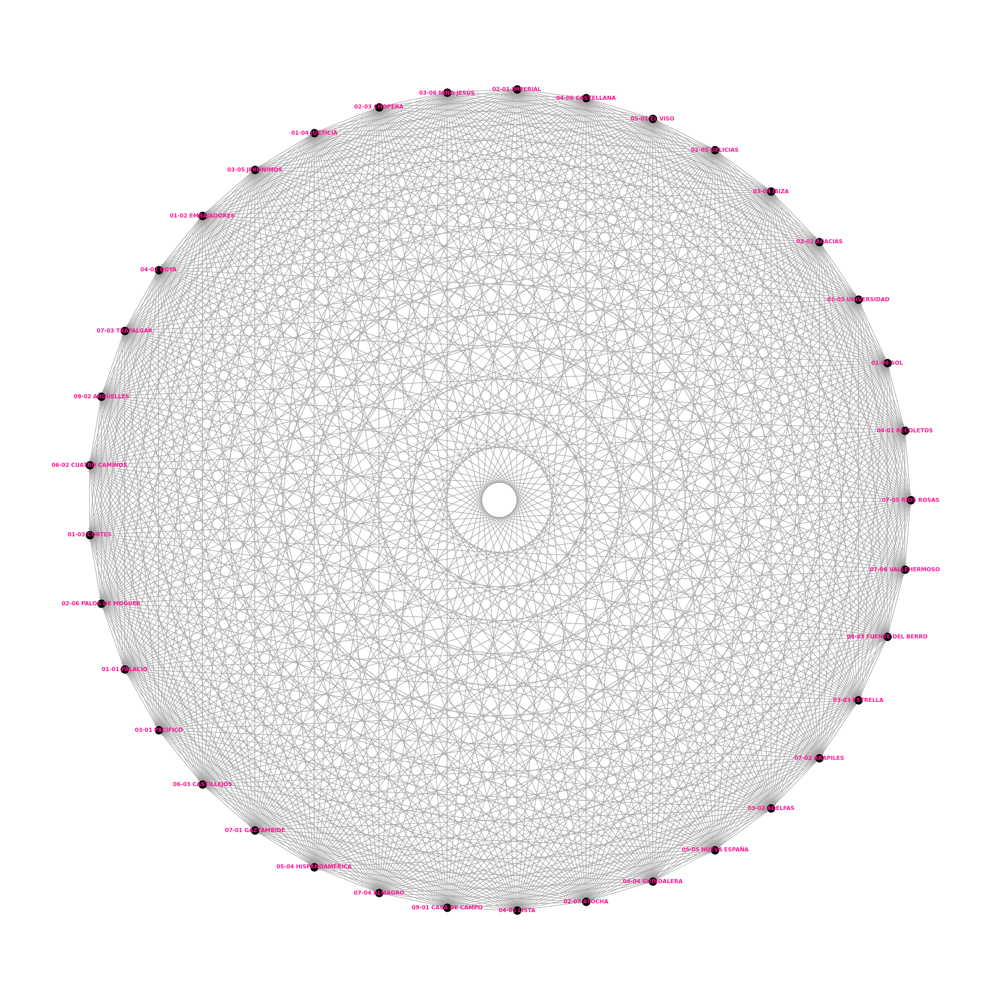

In [ ]:
import networkx as nx
G = nx.from_pandas_edgelist(graph_best ,source='origin', target='destination', edge_attr=True, create_using=nx.DiGraph())
nx.draw_circular(G, with_labels=True, font_color = 'deeppink', font_weight = 'bold', node_color = 'black', edge_color = 'darkgray')
plt.rcParams["figure.figsize"] = [30,30] #Ejecutar dos veces para obtener este tamaño
plt.show()  

A pesar de ser un grafo precioso, es inmanejable. Es imposible extraer información a partir de él. Por ello, consideramos subgrafos. 

En la siguiente celda, nada más ejecutarla al usuario, se le da la opción de elegir si quiere considerar el peor o el mejor mes. Seguidamente, se le ofrece la posibilidad de elegir un barrio. A continuación, se muestra el subgrafo dirigido y valorado que surge de tomar como el barrio introducido por el usuario como origen. El resto de nodos son los destinos: barrios distintos a los que llegan viajes del barrio de origen seleccionado. Los pesos son el número de viajese entre ellos.

En caso de introducir un mes no válido, es decir, que sea distinto de 'worst' o 'best', se lanza un error: *'INVALID MONTH'*

En caso de meter un barrio que no exista, es decir, ..., se lanza un error: *'INVALID NEIGHBOURHOOD'*

Los barrios válidos son los que se hallan como valores en el diccionario anteriormente creado: 'neighbourhood'. Crearemos una lista con tales valores, quedandonos borrando duplicados.

Los barrios disponibles, almacenados en la lista *valid_neighbourhoods* son: 01-01 PALACIO, 01-02 EMBAJADORES, 01-03 CORTES, 01-04 JUSTICIA, 01-05 UNIVERSIDAD, 01-06 SOL, 02-01 IMPERIAL, 02-02 ACACIAS, 02-03 CHOPERA, 02-05 DELICIAS, 02-06 PALOS DE MOGUER, 02-07 ATOCHA, 03-01 PACÍFICO, 03-02 ADELFAS, 03-03 ESTRELLAS, 03-04 IBIZA, 03-05 JERÓNIMOS, 03-06 NINÑO JESÚS, 04-01 RECOLETOS, 04-02 GOYA, 04-03 FUENTE DEL BERRO, 04-04 GUINDALERA, 04-05 LISTA, 04-06 CASTELLANA, 05-01 EL VISO, 05-02 PROSPERIDAD, 05-03 CIUDAD JARDÍN, 05-04 HISPANOAMÉRICA, 05-05 NUEVA ESPAÑA, 05-06 CASTILLA, 06-01 BELLAS VISTAS, 06-02 CUATRO CAMINOS, 06-03 CASTILLEJOS, 06-05 VALDEACEDERAS, 06-06 BERRUGUETE, 07-01 GAZTAMBIDE, 07-02 ARAPILES, 07-03 TRAFALGAR, 07-04 ALMAGRO, 07-05 RÍOS ROSAS, 07-06 VALLEHERMOSO, 09-01 CASA DE CAMPO, 09-02 ARGÜELLES, 13-02 SAN DIEGO, 15-01 VENTAS, 15-04 CONCEPCIÓN


Select month (worst/best): best
Select origin neighbourhood: 01-06 SOL


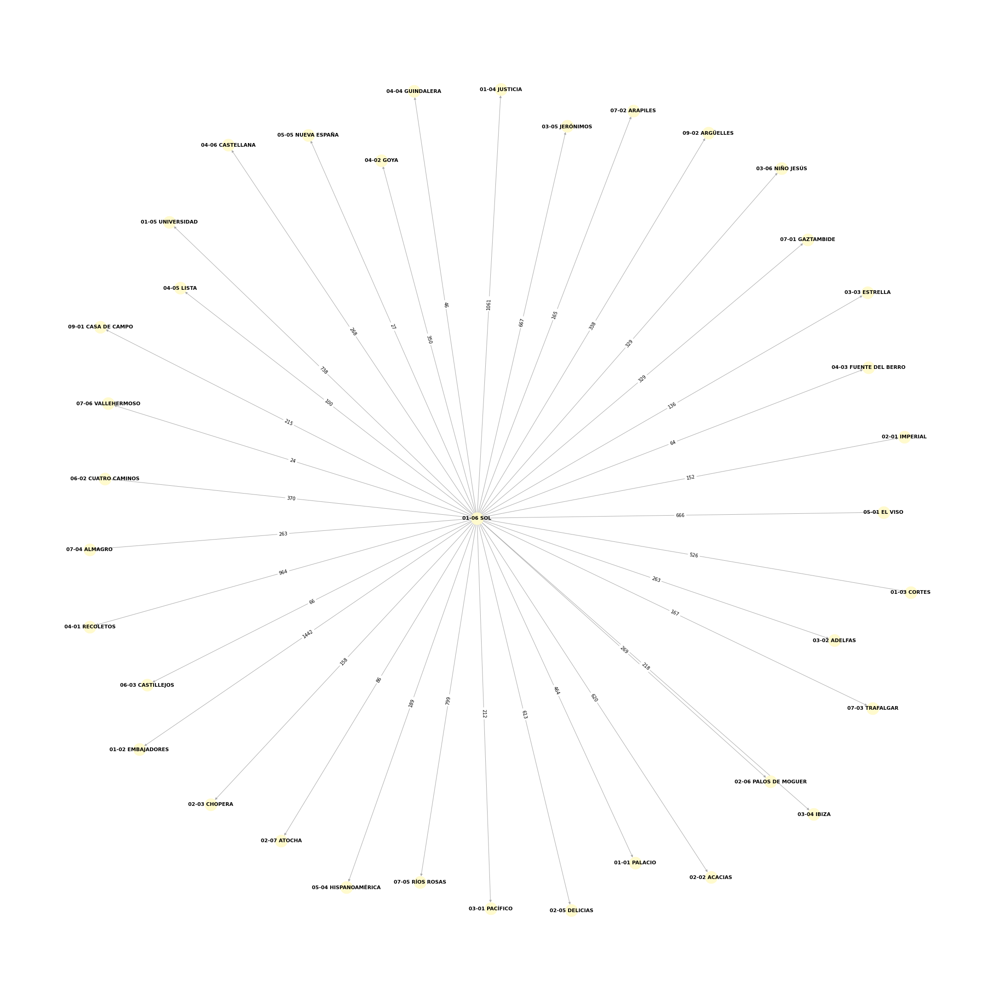

In [ ]:
valid_neighbourhoods = pd.Series(list(neighbourhood.values())).\
                                 drop_duplicates().tolist()

month = input('Select month (worst/best): ')


if month == 'worst':
  graph_aux = graph_worst

elif month == 'best':
  graph_aux = graph_best

else:
  raise NameError('INVALID MONTH')


neigh = input('Select origin neighbourhood: ')

if neigh not in valid_neighbourhoods:
  raise NameError('INVALID NEIGHBOURHOOD')

graph = graph_aux.loc[graph_aux['origin'] == neigh]


G = nx.from_pandas_edgelist(graph ,source='origin', target='destination', edge_attr='weight', create_using=nx.DiGraph())

labels = nx.get_edge_attributes(G,'weight')

pos = nx.spring_layout(G, k= 12/math.sqrt(G.order()))
nx.draw(G, pos=pos, with_labels=True, node_size=700, node_color = 'lemonchiffon', font_size = 11, font_weight='bold', edge_color = 'darkgray') #draw the graph
nx.draw_networkx_edge_labels(G, pos = pos, edge_labels = labels)

plt.rcParams["figure.figsize"] = [14,14] #Puede reajustarse el tamaño
plt.show()  

Si quisiésemos el grafo 'contrario', es decir, seleccionado un barrio de destino y un mes, conocer cuántos viajes llegan a él desde cada barrio de 
origen, ejecutaríamos este fragmento.

Se cambia el diseño del grafo hacia uno circular, para que le visualización sea mas sencilla. Tras probar con diseños similares al anterior, hemos consluido que esta opción es más adecuada, pues los nodos no quedan tan pegados. Sigue siendo un grafo dirigido y valorado. Aunque las flechas no se vean muy bien, pueden intuirse en el nodo destino, pues se manifiesta en un circulo mucho más grueso.

Select month (worst/best): best
Select deatination neighbourhood: 01-06 SOL


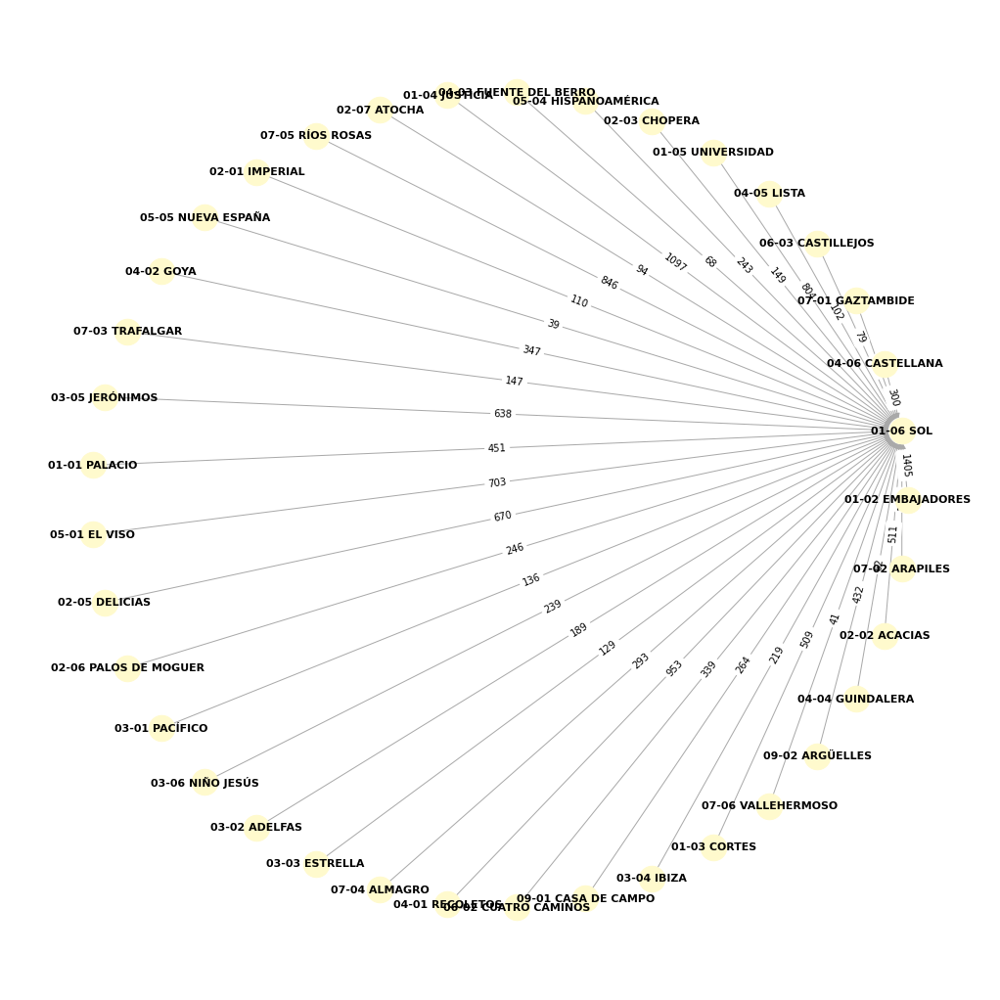

In [ ]:
valid_neighbourhoods = pd.Series(list(neighbourhood.values())).\
                                 drop_duplicates().tolist()

month = input('Select month (worst/best): ')


if month == 'worst':
  graph_aux = graph_worst

elif month == 'best':
  graph_aux = graph_best

else:
  raise NameError('INVALID MONTH')


neigh = input('Select deatination neighbourhood: ')

if neigh not in valid_neighbourhoods:
  raise NameError('INVALID NEIGHBOURHOOD')

graph = graph_aux.loc[graph_aux['destination'] == neigh]

G = nx.from_pandas_edgelist(graph ,source='origin', target='destination', edge_attr='weight', create_using=nx.DiGraph())
 
labels = nx.get_edge_attributes(G,'weight')

pos = nx.circular_layout(G)
nx.draw_circular(G, with_labels=True, node_size=700, node_color = 'lemonchiffon', edge_color = 'darkgray', font_size = 11, font_weight='bold') #draw the graph
nx.draw_networkx_edge_labels(G, pos = pos, edge_labels = labels)

plt.rcParams["figure.figsize"] = [15,15] #Puede reajustarse
plt.show()  

Definimos cuatro funciones auxiliares para llevar a cabo la idea basada en el algoritmo de Floyd. La primera es, simplemente para convertir una lista de listas de listas en una única lista. Las dos siguientes son las que llevan a cabo el algoritmo propiamente dicho: la primera devuelve todos los posibles caminos y la segunda, elige el de menor peso. Por último la cuarta función, se utiliza para combinar los resultados de la primera (los caminos con un nodo intermedio) y la segunda (los caminos con dos nodos intermedios) iteración. (Faltaría comentar las funciones bien Aurora)

In [ ]:
def separate(l):
    """
    Function that transforms a list of lists into a single list.
    
    Parameters
    ----------
        l : list 
        
    Returns
    --------
        res : list
    """
    res = []
    for elem_l in l:
      for i in elem_l:
        res.append(i)
    return res

In [ ]:
def min_path_algorithm(key, values):
    """
    This function returns all possible paths for each pair of nodes.
    
    Parameters
    ----------
        key : node [str]
        values : list of tuples. Each tuple contains in this order the initial node, 
        the final node, the weight of the path in between them and either 'start' if
        the key node is also the initial node or 'end' if the key node is, in this 
        case, the final node
        
    Returns
    --------
        res : list with all the possible paths beginning, passing through or 
        finishing in the key node
        
    Example
    -------
    key: '4'
    values: [('4', '2', 9.0, 'start'),
              ('4', '3', 24.0, 'start'),
              ('4', '6', 12.0, 'start'),
              ('4', '5', 24.0, 'start'),
              ('3', '4', 7.0, 'end'),
              ('2', '4', 22.0, 'end'),
              ('5', '4', 13.0, 'end')])]

    -------

    res: [[(('3', '4'), ('3', '4', 7.0, 'end')),
          (('3', '2'), ('3', '2', 16.0, 'end-4-start')),
          (('3', '6'), ('3', '6', 19.0, 'end-4-start')),
          (('3', '5'), ('3', '5', 31.0, 'end-4-start')),
          (('2', '4'), ('2', '4', 22.0, 'end')),
          (('2', '3'), ('2', '3', 46.0, 'end-4-start')),
          (('2', '6'), ('2', '6', 34.0, 'end-4-start')),
          (('2', '5'), ('2', '5', 46.0, 'end-4-start')),
          (('5', '4'), ('5', '4', 13.0, 'end')),
          (('5', '2'), ('5', '2', 22.0, 'end-4-start')),
          (('5', '3'), ('5', '3', 37.0, 'end-4-start')),
          (('5', '6'), ('5', '6', 25.0, 'end-4-start'))]]
    """
    res = []
    for sv in values:
        if sv[3]=='end':
            res.append(((sv[0], sv[1]), sv))
            for tv in values:
                if tv[3]=='start':
                    if sv[1]==tv[0] and sv[0]!=tv[1]:
                        res.append(((sv[0], tv[1]), (sv[0], tv[1], sv[2]+tv[2], sv[3]+'_'+str(key)+'_'+tv[3])))
    return res

In [ ]:
def select_min_path(key, values):
    """

    Function that returns the minimun weight path between every pair of nodes.
    
    Parameters
    ----------
        key : pair of nodes [tuple]
        values :  list of tuples. Each tuple contains in this order the initial node, 
        the final node, the weight of the path in between them and the path between
        these nodes.
        
    Returns
    --------
        key : pair of nodes [tuple]
        minvalue: tuple that contains in this order the initial node, 
        the final node, the minimun weight of the path in between them and 
        said path.

    Example
    -------
    key: ('3', '5')
    values : [('3', '5', 31.0, 'end-4-start'), ('3', '5', 24.0, 'end-2-start')]
        
    -------

    key: ('3', '5')
    minvalue: ('3', '5', 24.0, 'end-2-start')
    """
    values = list(values)
    minlen = float('inf')
    for value in values:
        if (minlen>value[2]):
            minlen = value[2]
            minvalue = value
    return key, minvalue 

In [ ]:
def compare(values):
    """
    Function that compares the values obtained when iterating twice. It picks 
    the minimun weight path. In case there are two paths with the same weight, it chooses the 
    one with less in-between nodes.
    
    Parameters
    ----------
        values : tuple of tuples. Each tuple contains in this order the initial node, 
        the final node, the weight of the path in between them and the path between
        these nodes. THe first tuple responds to Floyd's algorithm first iteration and 
        the second one, to Floyd's algorithm second iteration
        
        
    Returns
    --------
        value: tuple that contains in this order the initial node, 
        the final node, the minimun weight of the path in between them and 
        said path.
    
    Example
    -------
    values: (('2', '5', 8.0, 'end-6-start'), ('2', '5', 8.0, 'end'))

    -------

    value:  ('2', '5', 8.0, 'end-6-start')
    """
    if (values[0] == values[1]):
       return values[0]
    elif values[0][2] == values[1][2]:
          if values[0][3] < values[1][3]:
              return values[1]
          else:
              return values[0]
    else:
        if values[0][2] < values[1][2]:
          return values[0]
        else:
          return values[1]

Como estamos trabajando con dos meses, le damos la opción al usuario de elegir el peor o el mejor mes.

In [ ]:
if selected_month == 'best':
    rdd_floyd = rdd_best_floyd
else:
    rdd_floyd = rdd_worst_floyd


El algoritmo de Floyd-Warshall se utiliza para calcular los caminos mínimos entre todos los vértices de una red dirigida. En el algoritmo tradicional se lleva una matriz U con las distancias mínimas de forma que u_ij = distancia mínima del vértice i al j. También se utiliza una matriz P que identifica el camino. Así, U se inicializará con los pesos de los arcos {i,j} si existen o inf si no existen y P, de forma que p_ij = i. En la primera iteración consideramos todos los caminos que pasan por un vértice intermedio, en la segunda, por dos vértices intermedios, y así sucesivamente hasta llegar a n (siendo n el número de vértices del grafo). En cada una de estas iteraciones se considera el mínimo entre la distacia de la interación anterior y las distancias considerando un vértice intermedio más. Por tanto, al final del algoritmo, la matriz U tiene las distancias mínimas entre todos los vértices del grafo y la matriz P indica el camino a seguir. Nuestra idea es realizar solo dos de estas iteraciones para considerar ningún, uno o dos nodos intermedios.


Nos ha parecido interesante (además de una parte importante de la práctica), en lugar de implementar este algoritmo tal cual, basarnos en su idea fundamental e intentar paralelizarlo. Para ello, primero lo hemos esquematizado como un algoritmo Map-Reduce y lo hemos adaptado a Spark para obtener el código que aparece a continuación:

In [ ]:
#ALGORITMO DE FLOYD


selected_month = input('Select month (best/worst): ')


num_inter_node = 2
list_trips_Floyd = []
for i in range(1,num_inter_node+1):
    # las claves son los nodos y los valores son (start_node, end_node, value, trayecto)
    # donde trayecto indica cómo va el recorrido desde start_node hasta end_node.
    # Si solo pone start quiere decir que la clave es un start_node y el camino es start_node -> end_node
    # Si solo pone end quiere decir que la clave es un end_node
    rdd_start = rdd_floyd.mapValues(list).map(lambda x: (x[0][0],x[1])).mapValues(lambda x: (x[0],x[1],x[2],'start')).groupByKey().mapValues(list)
    rdd_end = rdd_floyd.mapValues(list).map(lambda x: (x[0][1],x[1])).mapValues(lambda x:(x[0],x[1],x[2],'end')).groupByKey().mapValues(list)
    rdd_total = rdd_start.join(rdd_end).map(lambda x: (x[0],x[1][0]+x[1][1]))
    # Buscamos caminos nuevos utilizando 1,..,i vértices intermedios (o menos)
    rdd_paths = rdd_total.map(lambda x: min_path_algorithm(x[0],x[1]))
    # Cambiamos el formato de la rdd
    rdd_paths_list = sc.parallelize(separate(rdd_paths.collect())).groupByKey().mapValues(list)
    # Queremos el camino mínimo para cada par de nodos
    rdd_min = rdd_paths_list.map(lambda x: select_min_path(x[0],x[1]))
    # Guardamos esta rdd para luego calcular el camino
    list_trips_Floyd.append(rdd_min.collect())
    rdd_info = rdd_min

En rdd_trips_Floyd almacenamos los resultados de aplicar el algoritmo de Floyd adaptado. De esta forma, las claves serán el inicio y el final del camino y en los valores tendremos también el inicio y el final, el peso total del camino y un string con la descripción de la ruta.

In [ ]:
rdd_trips_Floyd = sc.parallelize(list_trips_Floyd[0]).join(sc.parallelize(list_trips_Floyd[1])).mapValues(lambda x: compare(x))

Se le pedirá al usuario un barrio de origen y otro de destino para devolver la ruta menos concurrida entre dichos barrios. Los barrios, basándonos en el dataset de estaciones de Bicimad son los siguientes: 01-01 PALACIO, 01-02 EMBAJADORES, 01-03 CORTES, 01-04 JUSTICIA, 01-05 UNIVERSIDAD, 01-06 SOL, 02-01 IMPERIAL, 02-02 ACACIAS, 02-03 CHOPERA, 02-05 DELICIAS, 02-06 PALOS DE MOGUER, 02-07 ATOCHA, 03-01 PACÍFICO, 03-02 ADELFAS, 03-03 ESTRELLAS, 03-04 IBIZA, 03-05 JERÓNIMOS, 03-06 NINÑO JESÚS, 04-01 RECOLETOS, 04-02 GOYA, 04-03 FUENTE DEL BERRO, 04-04 GUINDALERA, 04-05 LISTA, 04-06 CASTELLANA, 05-01 EL VISO, 05-02 PROSPERIDAD, 05-03 CIUDAD JARDÍN, 05-04 HISPANOAMÉRICA, 05-05 NUEVA ESPAÑA, 05-06 CASTILLA, 06-01 BELLAS VISTAS, 06-02 CUATRO CAMINOS, 06-03 CASTILLEJOS, 06-05 VALDEACEDERAS, 06-06 BERRUGUETE, 07-01 GAZTAMBIDE, 07-02 ARAPILES, 07-03 TRAFALGAR, 07-04 ALMAGRO, 07-05 RÍOS ROSAS, 07-06 VALLEHERMOSO, 09-01 CASA DE CAMPO, 09-02 ARGÜELLES, 13-02 SAN DIEGO, 15-01 VENTAS, 15-04 CONCEPCIÓN.
Si algún barrio no se escribe de la manera exacta que se indica (número distrito-número nombre del barrio en mayúsculas y con tilde), dará fallo. En el código siguiente pedimos al usuario los barrios y escribimos la ruta completa que debe seguir.

In [ ]:
orig = input("Select origin: ")
dest = input("Select destination: ")

if (orig not in valid_neighbourhoods) or (dest not in valid_neighbourhoods):
  raise NameError('INVALID NEIGHBOURHOOD')

dict_trips_Floyd = rdd_trips_Floyd.collectAsMap()
journey = dict_trips_Floyd[(orig,dest)][3]
best_path1 = orig

while journey != 'end':
      best_path1 = best_path1 + '->' + journey.split(sep='_')[1]
      journey = dict_trips_Floyd[(journey.split(sep='_')[1],dest)][3]

best_path1 = best_path1 + '->' + dest
journey = dict_trips_Floyd[(orig,dest)][3]
best_path2 = dest

while journey != 'end':
      best_path2 = journey[4] + '->' + best_path2
      journey = dict_trips_Floyd[(orig,journey.split(sep='_')[1])][3]
best_path2 = orig + '->' + best_path2

if best_path2 == best_path1:
    best_path = best_path1
elif best_path2 <= best_path1:
    best_path = best_path1
else:
    best_path = best_path2 

sentence = "The less crowded path to ride from Origin to Destination is: "
sentence + best_path

Por último mostraremos un ejemplo de funcionamiento del programa en el que la ruta óptima pasa por dos vértices intermedios, ya que como decíamos al principio, ninguna ruta óptima del mapa pasará por dos vértices.

Primero, se definen las aristas del grafo que vamos a utilizar.


In [ ]:
rdd_grafo = sc.parallelize([(('1','6'),('1','6',8.0,'')),(('2','3'),('2','3',15.0,'')),\
                           (('2','6'),('2','6',3.0,'')),(('2','5'),('2','5',15.0,'')),\
                           (('3','4'),('3','4',7.0,'')),(('4','2'),('4','2',9.0,'')),\
                           (('5','3'),('5','3',6.0,'')),(('5','1'),('5','1',10.0,'')),\
                           (('6','5'),('6','5',7.0,''))])

Para ver mejor las aristas del grafo, las vamos a mostrar en una tabla:

In [ ]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()
graph_example = spark.createDataFrame(rdd_grafo.map(lambda x: (x[0][0], x[0][1], x[1][2])),
                             schema = ['origin', 'destination', 'weight']).toPandas()

In [ ]:
display(graph_example)

,origin,destination,weight
0,1,6,8.0
1,2,3,15.0
2,2,6,3.0
3,2,5,15.0
4,3,4,7.0
5,4,2,9.0
6,5,3,6.0
7,5,1,10.0
8,6,5,7.0


Vamos a buscar el camino de menor peso entre los vértices 2 y 1. Hay una forma de llegar utilizando sólo un nodo intermedio, 2->5->1, esta ruta tiene un peso total de 25. Sin embargo, la ruta 2->6->5->1 tiene un peso inferior, 18. Vamos a ver como esta es la ruta seleccionada por el algoritmo.

In [ ]:
num_inter_node = 2
list_trips_example = []
for i in range(1,num_inter_node+1):
 
    rdd_start = rdd_grafo.mapValues(list).map(lambda x: (x[0][0],x[1])).mapValues(lambda x: (x[0],x[1],x[2],'start')).groupByKey().mapValues(list)
    rdd_end = rdd_grafo.mapValues(list).map(lambda x: (x[0][1],x[1])).mapValues(lambda x:(x[0],x[1],x[2],'end')).groupByKey().mapValues(list)
    rdd_total = rdd_start.join(rdd_end).map(lambda x: (x[0],x[1][0]+x[1][1]))
    # Buscamos caminos nuevos utilizando 1,..,i vértices intermedios (o menos)
    rdd_paths = rdd_total.map(lambda x: min_path_algorithm(x[0],x[1]))
    # Cambiamos el formato de la rdd
    rdd_paths_list = sc.parallelize(separate(rdd_paths.collect())).groupByKey().mapValues(list)
    # Queremos el camino mínimo para cada par de nodos
    rdd_min = rdd_paths_list.map(lambda x: select_min_path(x[0],x[1]))
    # Guardamos esta rdd para luego calcular el camino
    list_trips_example.append(rdd_min.collect())
    rdd_info = rdd_min

In [ ]:
rdd_trips_example = sc.parallelize(list_trips_example[0]).join(sc.parallelize(list_trips_example[1])).mapValues(lambda x: compare(x))

In [ ]:
orig = input("Select origin: ")
dest = input("Select destination: ")
dict_trips_example = rdd_trips_example.collectAsMap()
journey = dict_trips_example[(orig,dest)][3]
best_path1 = orig

while journey != 'end':
      best_path1 = best_path1 + '->' + journey.split(sep='_')[1]
      journey = dict_trips_example[(journey.split(sep='_')[1],dest)][3]

best_path1 = best_path1 + '->' + dest
journey = dict_trips_example[(orig,dest)][3]
best_path2 = dest

while journey != 'end':
      best_path2 = journey[4] + '->' + best_path2
      journey = dict_trips_example[(orig,journey.split(sep='_')[1])][3]
best_path2 = orig + '->' + best_path2

if best_path2 == best_path1:
    best_path = best_path1
elif best_path2 <= best_path1:
    best_path = best_path1
else:
    best_path = best_path2 

sentence = "The less crowded path to ride from Origin to Destination is: "
sentence + best_path

Select origin: 2
Select destination: 1


'The less crowded path to ride from Origin to Destination is: 2->6->5->1'